In [33]:
import os
import glob
import time

import PIL
import imageio
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
from IPython import display
import matplotlib.pyplot as plt
%matplotlib inline

## Step 1. 데이터셋 구성하기

In [34]:
cifar10 = tf.keras.datasets.cifar10

(train_x, _), (test_x, _) = cifar10.load_data()

train_x.shape

(50000, 32, 32, 3)

### 정규화하기

In [35]:
train_x = (train_x-127.5)/127.5

### 데이터 시각화

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

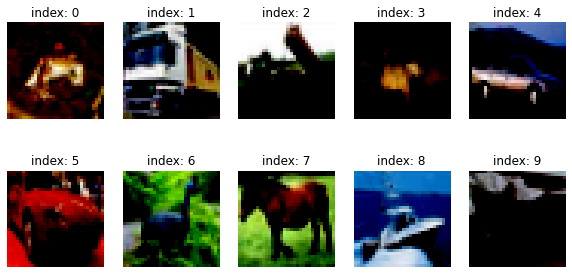

In [36]:
plt.figure(figsize=(10,5))

for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(train_x[i])
    plt.title(f'index: {i}')
    plt.axis('off')
plt.show()

### 미니배치 데이터셋 구성

In [37]:
BUFFER_SIZE = 50000
BATCH_SIZE = 256

In [38]:
train_dataset = tf.data.Dataset.from_tensor_slices(train_x).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

## Step 2. 생성자 모델 구현하기

In [39]:
def make_generator_model():

    # Start
    model = tf.keras.Sequential()

    # First: Dense layer
    model.add(layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Second: Reshape layer
    model.add(layers.Reshape((8, 8, 256)))

    # Third: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(128, kernel_size=(5, 5), strides=(1, 1), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Fourth: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(64, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Fifth: Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(3, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False, \
                                     activation='tanh'))

    return model

In [40]:
generator = make_generator_model()

generator.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_2 (Dense)              (None, 16384)             1638400   
_________________________________________________________________
batch_normalization_3 (Batch (None, 16384)             65536     
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 16384)             0         
_________________________________________________________________
reshape_1 (Reshape)          (None, 8, 8, 256)         0         
_________________________________________________________________
conv2d_transpose_3 (Conv2DTr (None, 8, 8, 128)         819200    
_________________________________________________________________
batch_normalization_4 (Batch (None, 8, 8, 128)         512       
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 8, 8, 128)        

In [41]:
noise = tf.random.normal([1, 100]) # 가우시안 분포에서 뽑아낸 랜덤 벡터로 이루어진 노이즈 벡터

In [42]:
generated_image = generator(noise, training=False)
generated_image.shape

TensorShape([1, 32, 32, 3])

## Step 3. 판별자 모델 구현하기

In [43]:
def make_discriminator_model():

    # Start
    model = tf.keras.Sequential()

    # First: Conv2D Layer
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[32, 32, 3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.5))

    # Second: Conv2D Layer
    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.5))

    # Third: Flatten Layer
    model.add(layers.Flatten())

    # Fourth: Dense Layer
    model.add(layers.Dense(1))

    return model

In [44]:
discriminator = make_discriminator_model()

discriminator.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 16, 16, 64)        4864      
_________________________________________________________________
leaky_re_lu_8 (LeakyReLU)    (None, 16, 16, 64)        0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 8, 8, 128)         204928    
_________________________________________________________________
leaky_re_lu_9 (LeakyReLU)    (None, 8, 8, 128)         0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 8, 8, 128)         0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 8192)             

In [45]:
decision = discriminator(generated_image, training=False)
decision

<tf.Tensor: shape=(1, 1), dtype=float32, numpy=array([[-0.00095497]], dtype=float32)>

## Step 4. 손실함수와 최적화 함수 구현하기

In [46]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [47]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [48]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

In [49]:
def discriminator_accuracy(real_output, fake_output):
    real_accuracy = tf.reduce_mean(tf.cast(tf.math.greater_equal(real_output, tf.constant([0.5])), tf.float32))
    fake_accuracy = tf.reduce_mean(tf.cast(tf.math.less(fake_output, tf.constant([0.5])), tf.float32))
    return real_accuracy, fake_accuracy

In [50]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

In [51]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

In [52]:
noise_dim = 100
num_examples_to_generate = 16

seed = tf.random.normal([num_examples_to_generate, noise_dim])

## Step 5. 훈련과정 상세 기능 구현하기 

In [53]:
@tf.function
def train_step(images):  #(1) 입력데이터
    noise = tf.random.normal([BATCH_SIZE, noise_dim])  #(2) 생성자 입력 노이즈

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:  #(3) tf.GradientTape() 오픈
        generated_images = generator(noise, training=True)  #(4) generated_images 생성

        #(5) discriminator 판별
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        #(6) loss 계산
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

        #(7) accuracy 계산
        real_accuracy, fake_accuracy = discriminator_accuracy(real_output, fake_output) 
    
    #(8) gradient 계산
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    #(9) 모델 학습
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss, real_accuracy, fake_accuracy  #(10) 리턴값

In [54]:
def generate_and_save_images(model, epoch, it, sample_seeds):

    predictions = model(sample_seeds, training=False)

    fig = plt.figure(figsize=(4, 4))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow((predictions[i] + 1)/2.0)
        plt.axis('off')
   
    plt.savefig('{}/aiffel/dcgan_newimage/cifar10/generated_samples5/sample_epoch_{:04d}_iter_{:03d}.png'
                    .format(os.getenv('HOME'), epoch, it))

    plt.show()

In [55]:
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 15, 6    # matlab 차트의 기본 크기를 15,6으로 지정해 줍니다.

def draw_train_history(history, epoch):
    # summarize history for loss  
    plt.subplot(211)  
    plt.plot(history['gen_loss'])  
    plt.plot(history['disc_loss'])  
    plt.title('model loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['gen_loss', 'disc_loss'], loc='upper left')  

    # summarize history for accuracy  
    plt.subplot(212)  
    plt.plot(history['fake_accuracy'])  
    plt.plot(history['real_accuracy'])  
    plt.title('discriminator accuracy')  
    plt.ylabel('accuracy')  
    plt.xlabel('batch iters')  
    plt.legend(['fake_accuracy', 'real_accuracy'], loc='upper left')  
    
    # training_history 디렉토리에 epoch별로 그래프를 이미지 파일로 저장합니다.
    plt.savefig('{}/aiffel/dcgan_newimage/cifar10/training_history5/train_history_{:04d}.png'
                    .format(os.getenv('HOME'), epoch))
    plt.show()

In [56]:
checkpoint_dir = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/training_checkpoints5'

checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

## Step 6. 학습 과정 진행하기

In [57]:
def train(dataset, epochs, save_every):
    start = time.time()
    history = {'gen_loss':[], 'disc_loss':[], 'real_accuracy':[], 'fake_accuracy':[]}

    for epoch in range(epochs):
        epoch_start = time.time()
        for it, image_batch in enumerate(dataset):
            gen_loss, disc_loss, real_accuracy, fake_accuracy = train_step(image_batch)
            history['gen_loss'].append(gen_loss)
            history['disc_loss'].append(disc_loss)
            history['real_accuracy'].append(real_accuracy)
            history['fake_accuracy'].append(fake_accuracy)

            if it % 50 == 0:
                display.clear_output(wait=True)
                generate_and_save_images(generator, epoch+1, it+1, seed)
                print('Epoch {} | iter {}'.format(epoch+1, it+1))
                print('Time for epoch {} : {} sec'.format(epoch+1, int(time.time()-epoch_start)))

        if (epoch + 1) % save_every == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        display.clear_output(wait=True)
        generate_and_save_images(generator, epochs, it, seed)
        print('Time for training : {} sec'.format(int(time.time()-start)))

        draw_train_history(history, epoch)

In [58]:
save_every = 5
EPOCHS = 50

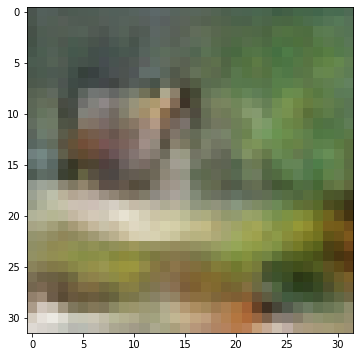

In [59]:
checkpoint_dir = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/training_checkpoints5'

latest = tf.train.latest_checkpoint(checkpoint_dir)
checkpoint.restore(latest)

generator = checkpoint.generator
discriminator = checkpoint.discriminator

# 로드한 모델이 정상적으로 이미지를 생성하는지 확인해 봅니다. 
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

np_generated = generated_image.numpy()
np_generated = (np_generated * 127.5) + 127.5   # reverse of normalization
np_generated = np_generated.astype(int)
plt.imshow(np_generated[0])
plt.show()  # 정상적으로 모델이 로드되었다면 랜덤 이미지가 아니라 CIFAR-10 이미지가 그려질 것입니다.

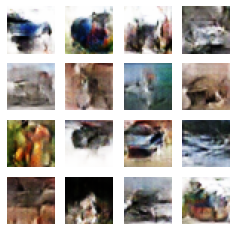

Time for training : 1527 sec


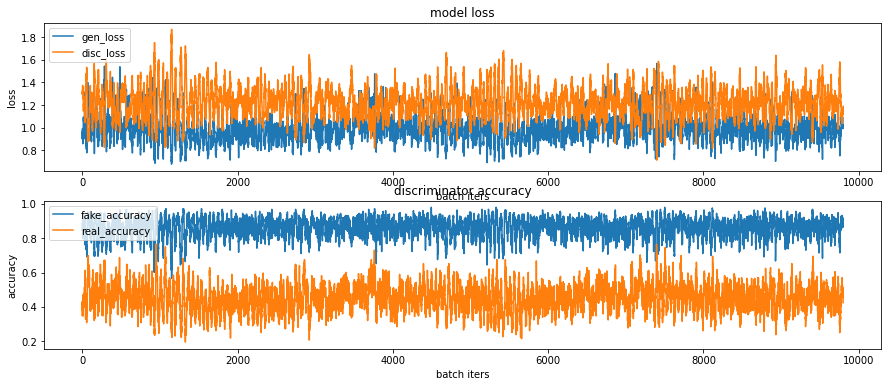

CPU times: user 19min 40s, sys: 6min 10s, total: 25min 50s
Wall time: 25min 29s


In [60]:
%%time
train(train_dataset, EPOCHS, save_every)

In [61]:
anim_file = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/cifar10_dcgan5.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('{}/aiffel/dcgan_newimage/cifar10/generated_samples5/sample*.png'.format(os.getenv('HOME')))
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

!ls -l ~/aiffel/dcgan_newimage/cifar10/cifar10_dcgan5.gif

-rw-r--r-- 1 root root 1251605 Nov 16 14:25 /aiffel/aiffel/dcgan_newimage/cifar10/cifar10_dcgan5.gif


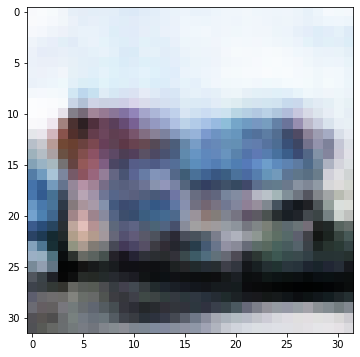

In [62]:
checkpoint_dir = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/training_checkpoints5'

latest = tf.train.latest_checkpoint(checkpoint_dir)
checkpoint.restore(latest)

generator = checkpoint.generator
discriminator = checkpoint.discriminator

# 로드한 모델이 정상적으로 이미지를 생성하는지 확인해 봅니다. 
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

np_generated = generated_image.numpy()
np_generated = (np_generated * 127.5) + 127.5   # reverse of normalization
np_generated = np_generated.astype(int)
plt.imshow((generated_image[0]+1)/2.0)
plt.show()  # 정상적으로 모델이 로드되었다면 랜덤 이미지가 아니라 CIFAR-10 이미지가 그려질 것입니다.

## 회고
### 1. 초기 모델
### <center>1) 샘플 이미지들을 합친 gif</center>
<img width="60%" src="https://user-images.githubusercontent.com/70715543/141684998-045252e0-c314-4a39-8fdd-b4897f6b7234.gif"/>  


### <center>2) 마지막으로 생성된 샘플 이미지</center>
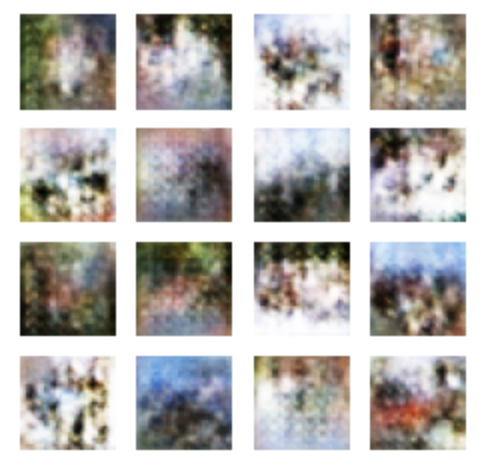


### <center>3) loss, accuracy 결과</center>
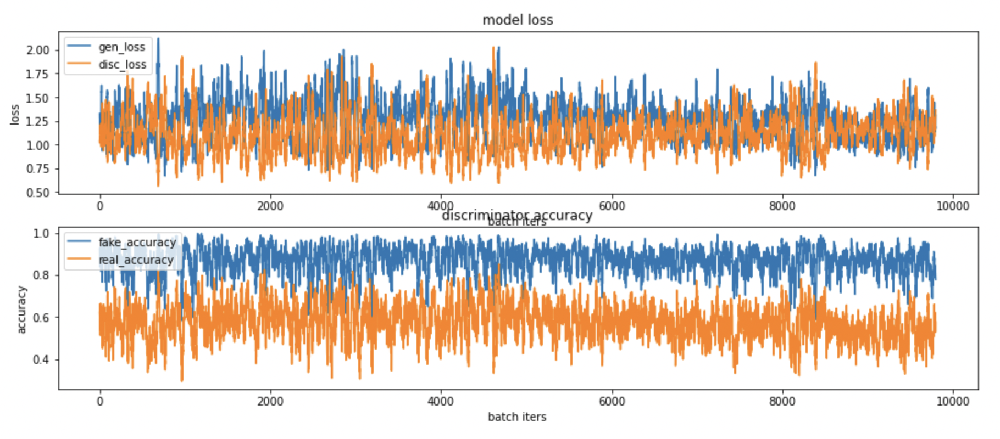

- gif 이미지를 보면 점점 선명해지는 것을 알 수 있지만, 마지막으로 생성된 샘플 이미지를 육안으로 봤을 때 물체를 판별하기 어려워 보인다.
- fake accuracy가 0.5로 하향하지는 못하고 있다.

성능 업 아이디어
1. 배치정규화 없애기, drop out 0.5?
2. epoch 500으로
3. learning late 2배 늘이기
4. batch 사이즈 늘리기 + 줄이기(64로)
5. leackyrelu(0.2)

### 2. Epoch 500
#### - 초기 모델의 결과를 봤을 때 fake accuracy가 0.5로 수렴하지 못했으므로 epoch를 늘려보았다.
#### - 처음에는 200으로 했으나, 큰 변화가 없는 것 같아서 500으로 다시 진행했다.
### <center>1) 샘플 이미지들을 합친 gif</center>
<img width="60%" src="https://user-images.githubusercontent.com/70715543/141764474-55392e6b-63b8-458b-bd55-37d128d9341c.gif"/>

### <center>2) 마지막으로 생성된 샘플 이미지</center>
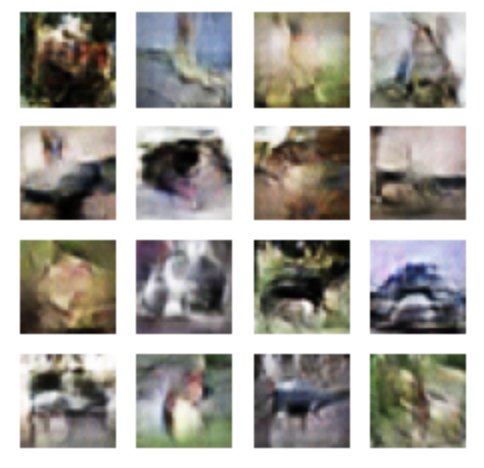


### <center>3) loss, accuracy 결과</center>
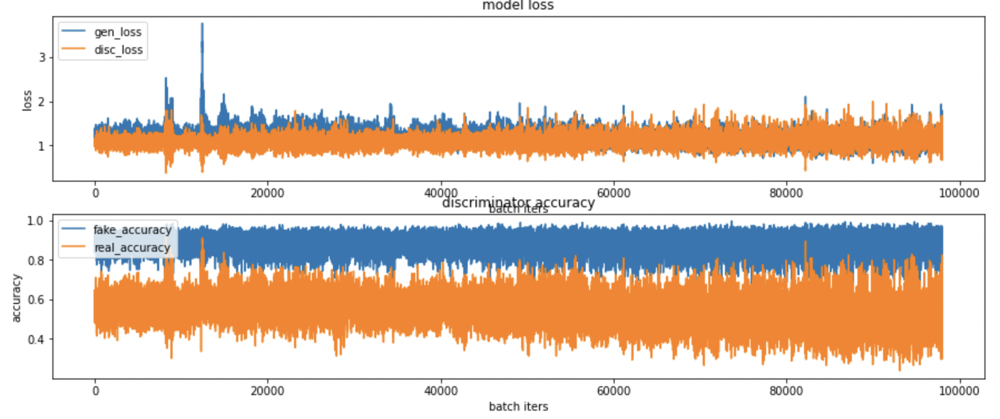

- 마지막으로 생성된 샘플 이미지를 육안으로 봤을 때는 물체를 확실히 판별하기 더 좋아졌지만, fake accuracy와 loss를 봤을 때 크게 차이가 나는 지는 잘 모르겠다.


### 3. learning late 2배
### - learning late가 가장 중요한 하이어파라미터라고 생각을 해서 2배로 키워봤다.
### <center>1) 샘플 이미지들을 합친 gif</center>
<img width="60%" src="https://user-images.githubusercontent.com/70715543/141797657-ded803b3-a81c-4987-a03d-f9d616092cb3.gif"/>

### <center>2) 마지막으로 생성된 샘플 이미지</center>
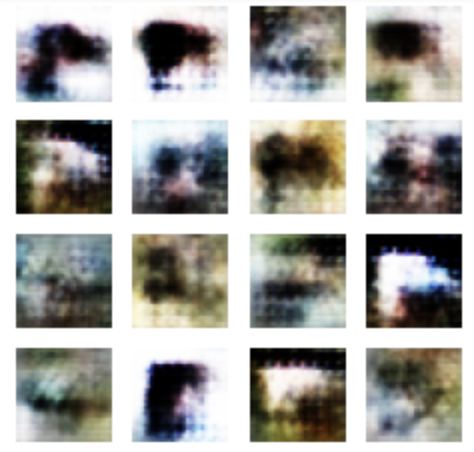

### <center>3) loss, accuracy 결과</center>
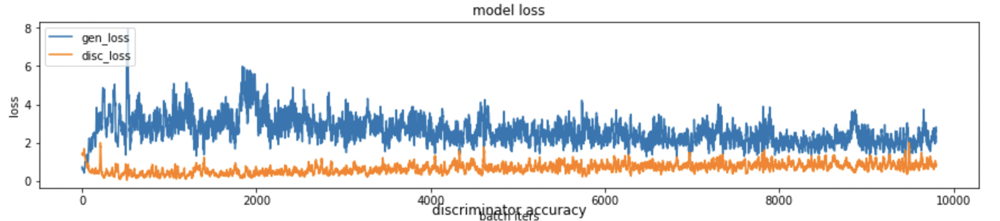
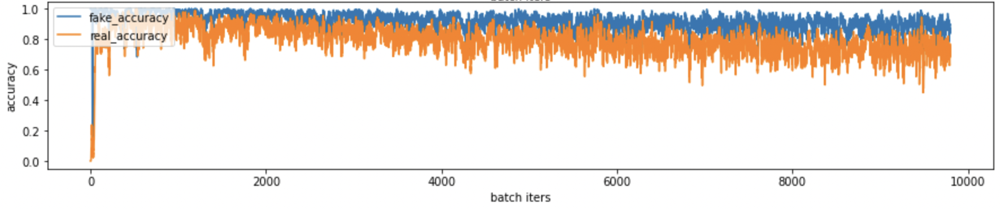
- 결과가 더 안 좋게 나왔다.
- 육안으로 보기에도 마지막으로 생성된 샘플 이미지도 더 별로이고, fake accuracy와 loss 모두 더 안 좋은 값이 나왔다.
- learning late는 기존의 값이 더 나은 것 같다.
- real accuracy가 요동치는 폭이 좁아져서 그 부분에서는 성능이 좋아진 것 같다. 

### 4. LeackyReLu(alpha=0.2)
### - leackyrelu의 음의 방향 기울기에 대한 계수를 바꿔봤다. 
### <center>1) 샘플 이미지들을 합친 gif</center>
<img width="60%" src="https://user-images.githubusercontent.com/70715543/141826722-515e25d1-1160-4f1b-baaf-cab1d362a4e5.gif"/>

### <center>2) 마지막으로 생성된 샘플 이미지</center>
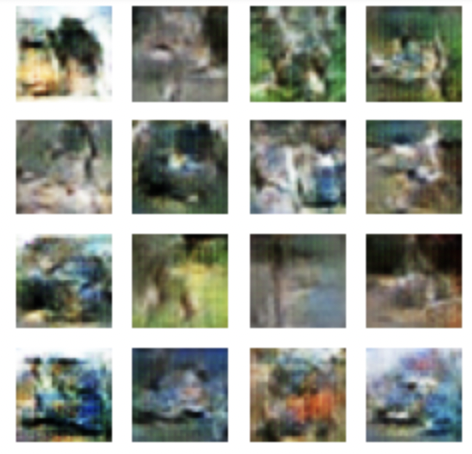

### <center>3) loss, accuracy 결과</center>
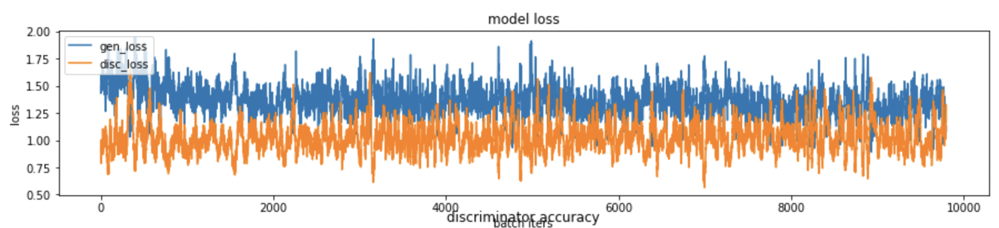
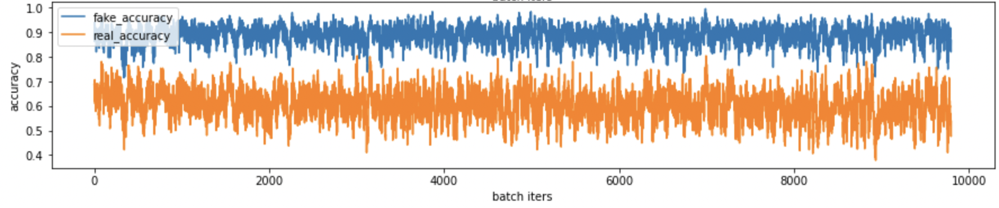
- 마지막으로 생성된 이미지는 한 눈에 보기에도 더 판별하기 쉬워졌다.
- accuracy나 loss 그래프 모두 초기 모델과 비슷하다.
- LeackyRelu의 값은 accuracy와 loss에 영향이 별로 없다.

### 5. Dropout 0.5
### - leackyrelu의 음의 방향 기울기에 대한 계수를 바꿔봤다. 
### <center>1) 샘플 이미지들을 합친 gif</center>
<img width="60%" src="https://user-images.githubusercontent.com/70715543/142005034-49903c68-6152-4c1b-bd50-2ebe718fc5f0.gif"/>

### <center>2) 마지막으로 생성된 샘플 이미지</center>
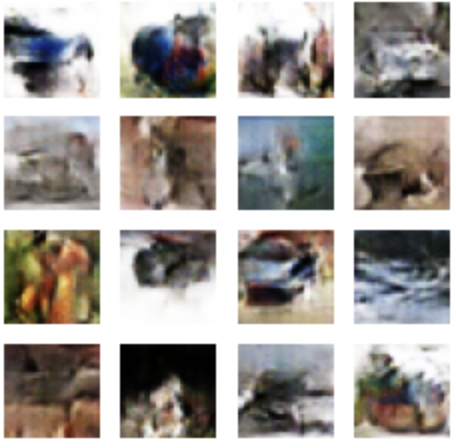

### <center>3) loss, accuracy 결과</center>
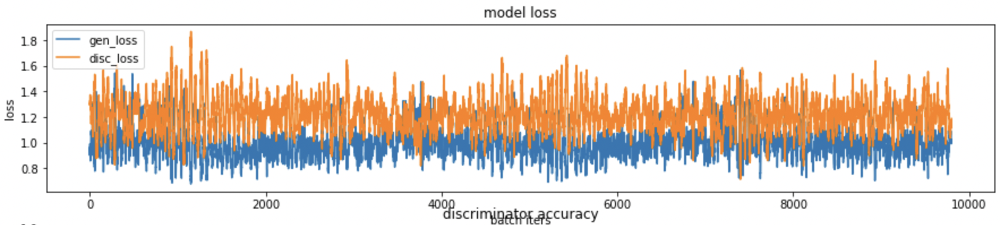
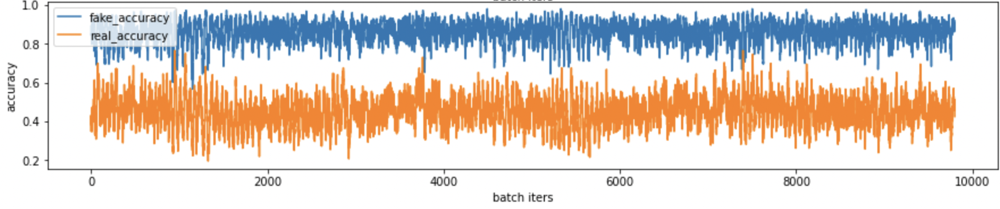
- 마지막으로 생성된 샘플 이미지를 보면 더 좋아졌음을 알 수 있다.


 ### 결론
 - 배치 사이즈를 64로 줄였는데, 미세하게 더 안좋아졌다.
 - 마지막으로 생성된 이미지들을 보면, epoch 500으로 한 것이 제일 좋았으며, LeackyRelu값을 0.2로 바꾼 것도 좋게 나왔다.
 - learning late를 2배로 했을 때 이미지가 제일 별로 였는데, 그래프를 분석해보면 다른 것들에 비해 real accuracy가 1에 가까운 것을 알 수 있다.
 - LeackyRelu의 alpha 값을 0.2로, dropout값을 0.5로 했을 때, Epoch 수를 500으로 늘렸을 때 이미지가 더 좋게 나온 다는 것을 알 수 있었다.
 - 아직 그래프를 분석하는 법은 잘 모르겠다. 